## Overfit Analysis
In this analysis, a resnet18 model is overfit to the chestxray available data.
And we try to see the regions used by the model for prediction.

In [62]:
import argparse

parser = argparse.ArgumentParser()
parser.add_argument('--dataset_name', type=str, default='COVID19') # required
parser.add_argument('--model_name', type=str, default='CNN') #required
parser.add_argument('--result_path', type=str, default='result', help='output path')
parser.add_argument('--data_path', type=str, default='data', help='path for data')

# Training
parser.add_argument('--num_epochs', type=int, default=30)
parser.add_argument('--batch_size', type=int, default=32)
parser.add_argument('--lr', type=float, default=0.0001)
parser.add_argument('-e', '--lr_decay', type=float, default=0.999995,
                    help='Learning rate decay, applied every step of the optimization')
parser.add_argument('--seed', type=int, default=1,
                    help='Random seed to use')
parser.add_argument('--log_step', type=int, default=100, help='step size for prining log info')
parser.add_argument('--save_step', type=int, default=20, help='step size for saving trained models')

parser.add_argument('--flag_retrain', default=False, action='store_true', help='Re train')
parser.add_argument('--flag_reg', default=False, action='store_true', help='Regularizer')
parser.add_argument('--flag_plot', default=False, action='store_true', help='Plot')

# Model parameters
args = parser.parse_args("")

In [63]:
import os, sys, time, shutil
import numpy as np
import importlib
import matplotlib.pyplot as plt
from MulticoreTSNE import MulticoreTSNE as TSNE
sys.path.append('..')

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.autograd as autograd
import torch.optim as optim
from torch.optim import lr_scheduler
from torch.utils.data import DataLoader
from torch.utils.data import Dataset
from torch.utils.tensorboard import SummaryWriter
from torchvision import datasets, transforms, utils
import torchvision
import pdb

device=torch.device('cuda:1' if torch.cuda.is_available() else 'cpu')

# Arguments
model_name=args.model_name + '-' + args.dataset_name
dataset_path=os.path.join(args.data_path, args.dataset_name)
output_path=os.path.join(args.result_path, model_name)

# saved checkpoint
model_path=os.path.join(output_path, 'snapshots')
net_path=os.path.join(model_path, 'net.pth')
adv_path = os.path.join(model_path, 'adv.pth')
sample_path=os.path.join(output_path, 'samples')
log_path=os.path.join(output_path, "log.txt")
run_path = os.path.join(output_path, 'runs')

params_str = 'debug'
writer_path=os.path.join(run_path, params_str) 

# makedir
def make_dir(dirname, rm=False):
    if not os.path.exists(dirname):
        os.makedirs(dirname)
    elif rm:
        print('rm and mkdir ', dirname)
        shutil.rmtree(dirname)
        os.makedirs(dirname)

make_dir(args.result_path)
make_dir(output_path)
make_dir(model_path)
make_dir(sample_path)
make_dir(run_path)
logf=open(log_path, 'w')
make_dir(writer_path, rm=True)
writer=SummaryWriter(comment=model_name, log_dir=writer_path)

rm and mkdir  result/CNN-COVID19/runs/debug


In [64]:
import datasets
importlib.reload(datasets)

<module 'datasets' from '/home/aka/Experiments/covid/covid-analysis/datasets.py'>

In [65]:
# Logging helper functions 
def log_loss(epoch, step, total_step, loss, start_time):
    # convert
    loss=loss.cpu().data.numpy()
    # msg
    message='Epoch [{}/{}], Step [{}/{}], Loss: {:.4f}, time: {:.4f}s'.format(
        epoch, args.num_epochs, step, total_step, loss, time.time() - start_time)
    # log out
    logf.write(message + '\n')
    print(message)
    
class AverageMeter(object):
    """Computes and stores the average and current value"""
    def __init__(self):
        self.reset()

    def reset(self):
        self.val = 0
        self.avg = 0
        self.sum = 0
        self.count = 0

    def update(self, val, n=1):
        self.val = val
        self.sum += val * n
        self.count += n
        self.avg = self.sum / self.count

In [66]:
class SingleChannel(object):
    def __call__(self, img):
        img = img[0,:,:].unsqueeze(0)
        return img

transform=transforms.Compose([transforms.Resize(310), 
                              transforms.CenterCrop(256),
                              transforms.ToTensor(),
                              SingleChannel()])
covid_dataset = datasets.COVID19_Dataset(imgpath=os.path.join(args.data_path, 'covid-chestxray-dataset/images'), 
                                         csvpath=os.path.join(args.data_path, 'covid-chestxray-dataset/metadata.csv'),
                                         transform=transform)
dataloader = DataLoader(covid_dataset, batch_size=args.batch_size, shuffle=True)

torch.Size([1, 256, 256]) ['COVID-19' 'Pneumonia' 'Viral Pneumonia']


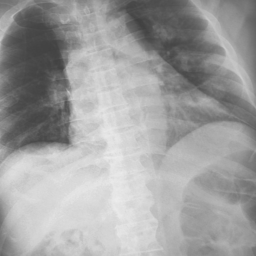

torch.Size([1, 256, 256]) ['COVID-19' 'Pneumonia' 'Viral Pneumonia']


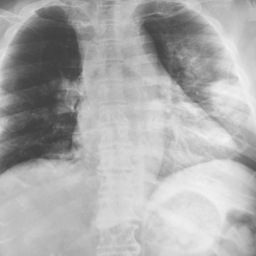

torch.Size([1, 256, 256]) ['COVID-19' 'Pneumonia' 'Viral Pneumonia']


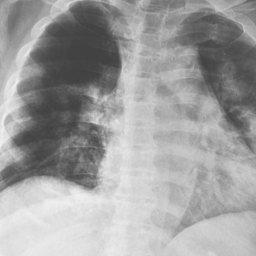

torch.Size([1, 256, 256]) ['COVID-19' 'Pneumonia' 'Viral Pneumonia']


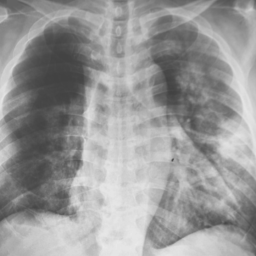

torch.Size([1, 256, 256]) ['COVID-19' 'Pneumonia' 'Viral Pneumonia']


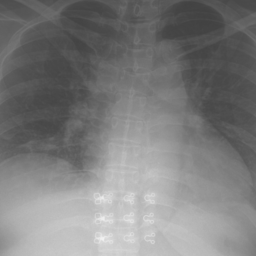

torch.Size([1, 256, 256]) ['COVID-19' 'Pneumonia' 'Viral Pneumonia']


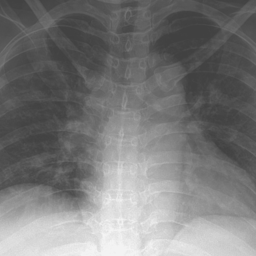

torch.Size([1, 256, 256]) ['ARDS' 'Pneumonia']


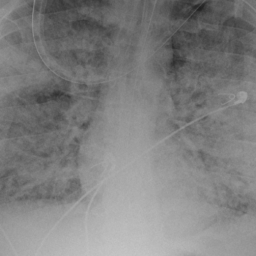

torch.Size([1, 256, 256]) ['COVID-19' 'Pneumonia' 'Viral Pneumonia']


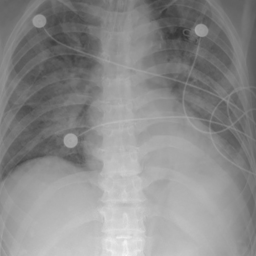

torch.Size([1, 256, 256]) ['COVID-19' 'Pneumonia' 'Viral Pneumonia']


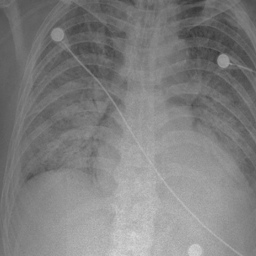

torch.Size([1, 256, 256]) ['Pneumonia' 'SARS' 'Viral Pneumonia']


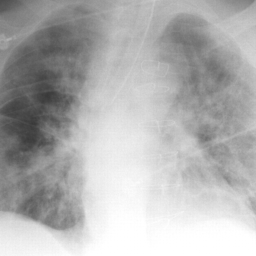

torch.Size([1, 256, 256]) ['Pneumonia' 'SARS' 'Viral Pneumonia']


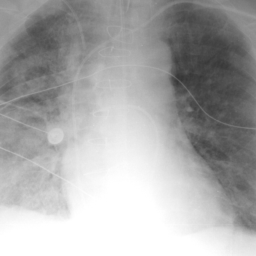

torch.Size([1, 256, 256]) ['Pneumonia' 'SARS' 'Viral Pneumonia']


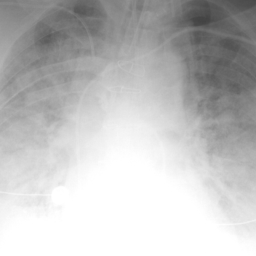

torch.Size([1, 256, 256]) ['Pneumonia' 'SARS' 'Viral Pneumonia']


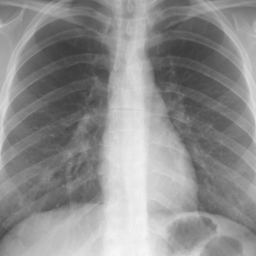

torch.Size([1, 256, 256]) ['Pneumonia' 'SARS' 'Viral Pneumonia']


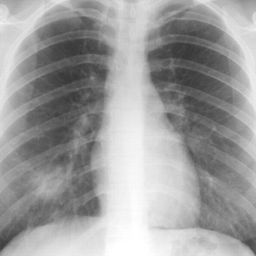

torch.Size([1, 256, 256]) ['Pneumonia' 'SARS' 'Viral Pneumonia']


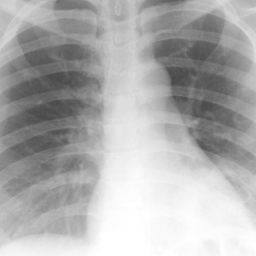

torch.Size([1, 256, 256]) ['Pneumonia' 'SARS' 'Viral Pneumonia']


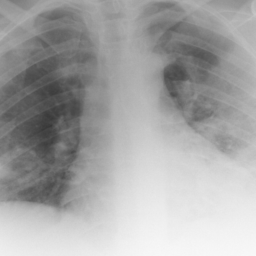

torch.Size([1, 256, 256]) ['Pneumonia' 'SARS' 'Viral Pneumonia']


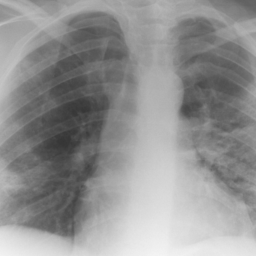

torch.Size([1, 256, 256]) ['Pneumonia' 'SARS' 'Viral Pneumonia']


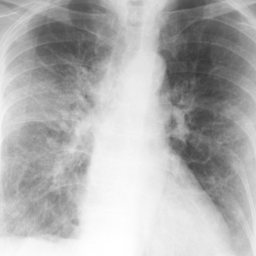

torch.Size([1, 256, 256]) ['Pneumonia' 'SARS' 'Viral Pneumonia']


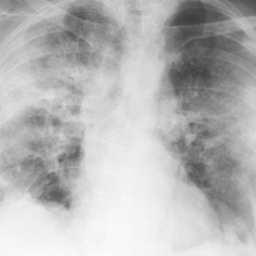

torch.Size([1, 256, 256]) ['Pneumonia' 'SARS' 'Viral Pneumonia']


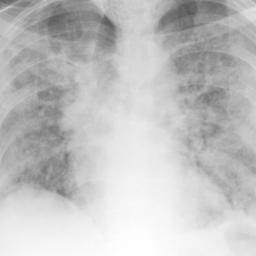

torch.Size([1, 256, 256]) ['COVID-19' 'Pneumonia' 'Viral Pneumonia']


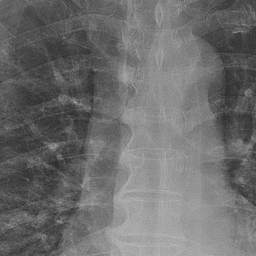

torch.Size([1, 256, 256]) ['COVID-19' 'Pneumonia' 'Viral Pneumonia']


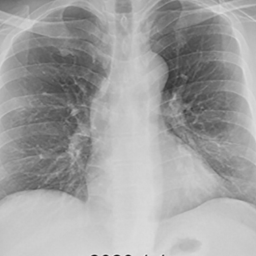

torch.Size([1, 256, 256]) ['COVID-19' 'Pneumonia' 'Viral Pneumonia']


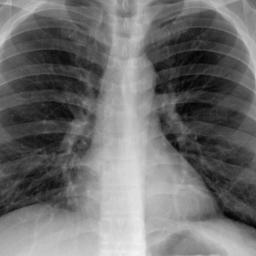

torch.Size([1, 256, 256]) ['COVID-19' 'Pneumonia' 'Viral Pneumonia']


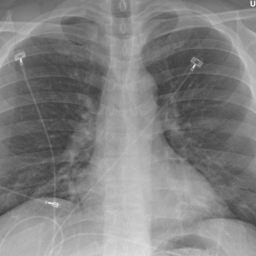

torch.Size([1, 256, 256]) ['COVID-19' 'Pneumonia' 'Viral Pneumonia']


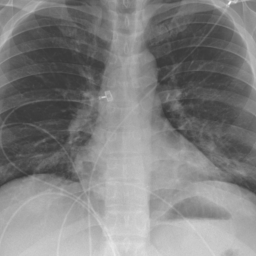

torch.Size([1, 256, 256]) ['COVID-19' 'Pneumonia' 'Viral Pneumonia']


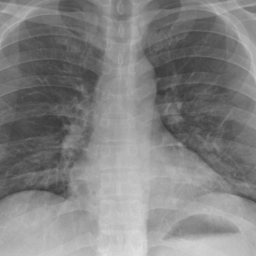

torch.Size([1, 256, 256]) ['COVID-19' 'Pneumonia' 'Viral Pneumonia']


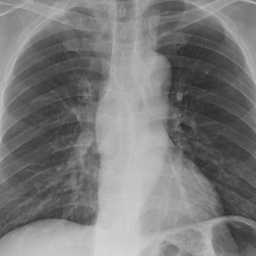

torch.Size([1, 256, 256]) ['COVID-19' 'Pneumonia' 'Viral Pneumonia']


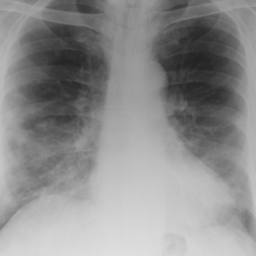

torch.Size([1, 256, 256]) ['COVID-19' 'Pneumonia' 'Viral Pneumonia']


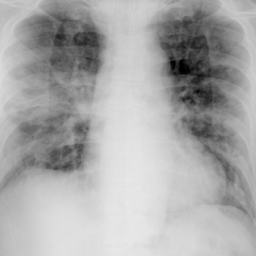

torch.Size([1, 256, 256]) ['COVID-19' 'Pneumonia' 'Viral Pneumonia']


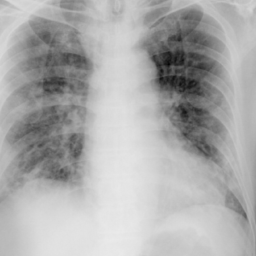

torch.Size([1, 256, 256]) ['COVID-19' 'Pneumonia' 'Viral Pneumonia']


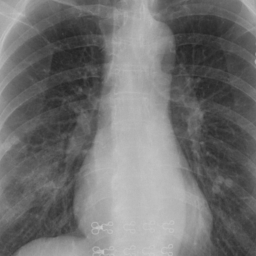

torch.Size([1, 256, 256]) ['COVID-19' 'Pneumonia' 'Viral Pneumonia']


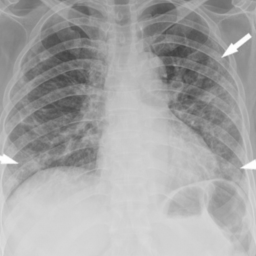

torch.Size([1, 256, 256]) ['COVID-19' 'Pneumonia' 'Viral Pneumonia']


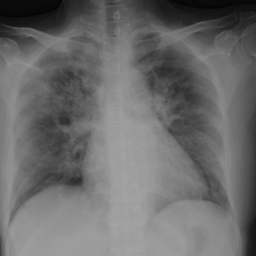

torch.Size([1, 256, 256]) ['COVID-19' 'Pneumonia' 'Viral Pneumonia']


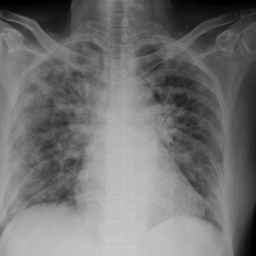

torch.Size([1, 256, 256]) ['COVID-19' 'Pneumonia' 'Viral Pneumonia']


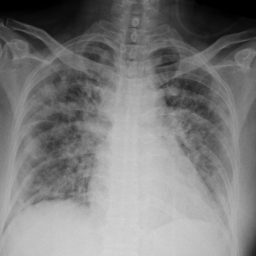

torch.Size([1, 256, 256]) ['COVID-19' 'Pneumonia' 'Viral Pneumonia']


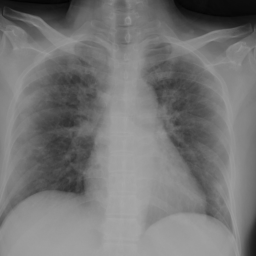

torch.Size([1, 256, 256]) ['COVID-19' 'Pneumonia' 'Viral Pneumonia']


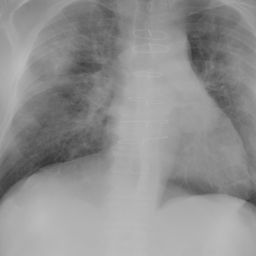

torch.Size([1, 256, 256]) ['COVID-19' 'Pneumonia' 'Viral Pneumonia']


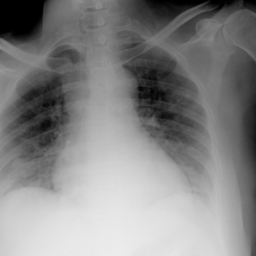

torch.Size([1, 256, 256]) ['COVID-19' 'Pneumonia' 'Viral Pneumonia']


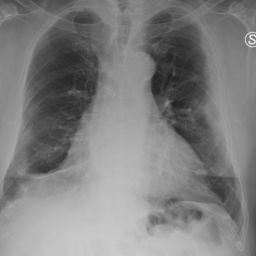

torch.Size([1, 256, 256]) ['COVID-19' 'Pneumonia' 'Viral Pneumonia']


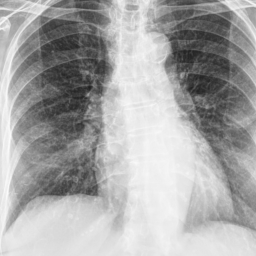

torch.Size([1, 256, 256]) ['COVID-19' 'Pneumonia' 'Viral Pneumonia']


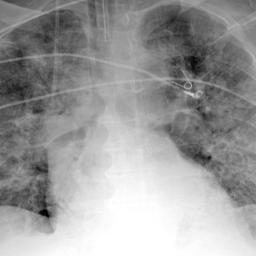

torch.Size([1, 256, 256]) ['ARDS' 'Pneumonia']


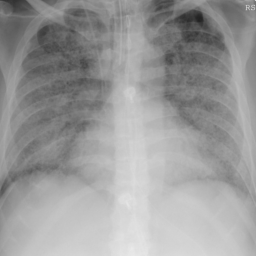

torch.Size([1, 256, 256]) ['ARDS' 'Pneumonia']


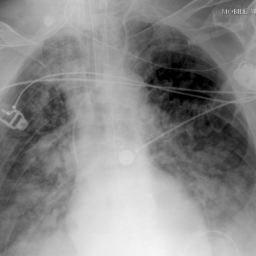

torch.Size([1, 256, 256]) ['ARDS' 'Pneumonia']


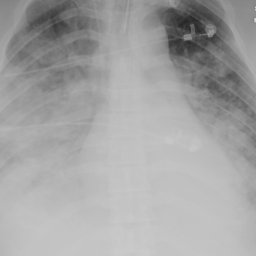

torch.Size([1, 256, 256]) []


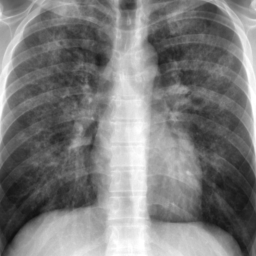

torch.Size([1, 256, 256]) ['Bacterial Pneumonia' 'Pneumonia' 'Streptococcus']


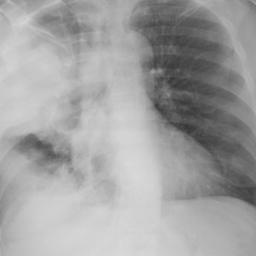

torch.Size([1, 256, 256]) ['Bacterial Pneumonia' 'Pneumonia' 'Streptococcus']


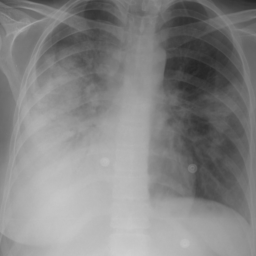

torch.Size([1, 256, 256]) ['Bacterial Pneumonia' 'Pneumonia' 'Streptococcus']


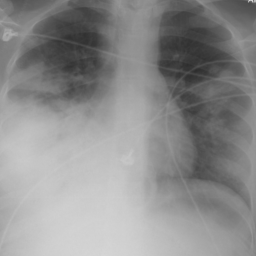

torch.Size([1, 256, 256]) ['Bacterial Pneumonia' 'Pneumonia' 'Streptococcus']


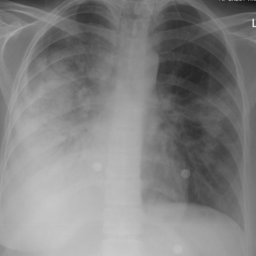

torch.Size([1, 256, 256]) ['Bacterial Pneumonia' 'Pneumonia' 'Streptococcus']


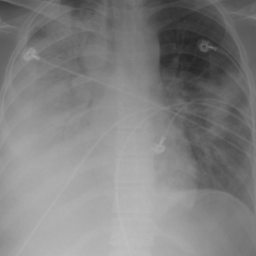

torch.Size([1, 256, 256]) ['Bacterial Pneumonia' 'Pneumonia' 'Streptococcus']


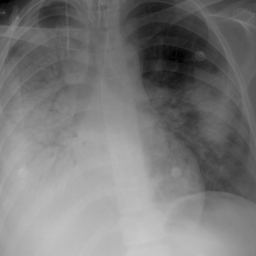

torch.Size([1, 256, 256]) ['COVID-19' 'Pneumonia' 'Viral Pneumonia']


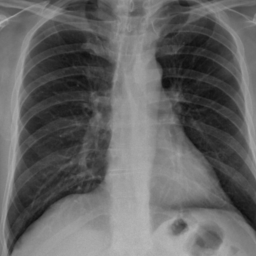

torch.Size([1, 256, 256]) ['COVID-19' 'Pneumonia' 'Viral Pneumonia']


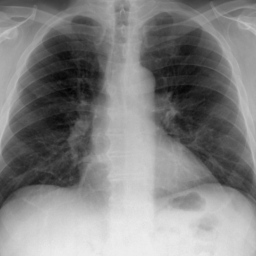

torch.Size([1, 256, 256]) ['COVID-19' 'Pneumonia' 'Viral Pneumonia']


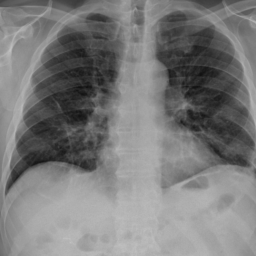

torch.Size([1, 256, 256]) ['COVID-19' 'Pneumonia' 'Viral Pneumonia']


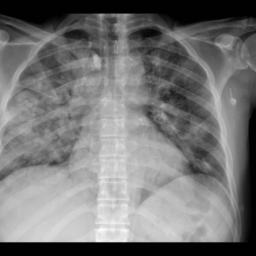

torch.Size([1, 256, 256]) ['COVID-19' 'Pneumonia' 'Viral Pneumonia']


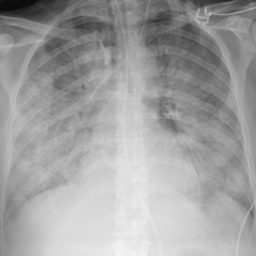

torch.Size([1, 256, 256]) ['No Finding']


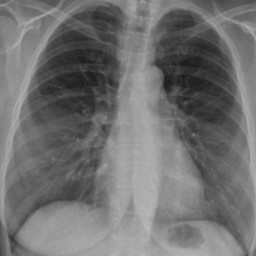

torch.Size([1, 256, 256]) ['COVID-19' 'Pneumonia' 'Viral Pneumonia']


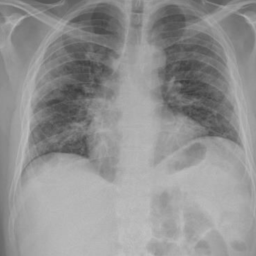

torch.Size([1, 256, 256]) ['COVID-19' 'Pneumonia' 'Viral Pneumonia']


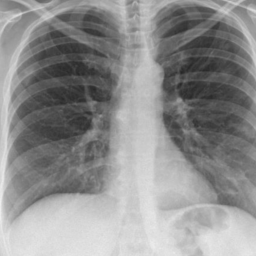

torch.Size([1, 256, 256]) ['COVID-19' 'Pneumonia' 'Viral Pneumonia']


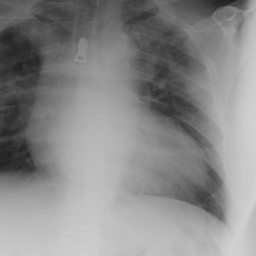

torch.Size([1, 256, 256]) ['COVID-19' 'Pneumonia' 'Viral Pneumonia']


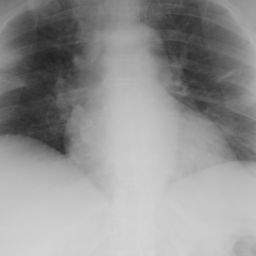

torch.Size([1, 256, 256]) ['COVID-19' 'Pneumonia' 'Viral Pneumonia']


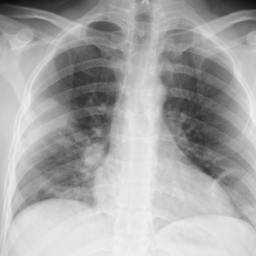

torch.Size([1, 256, 256]) ['COVID-19' 'Pneumonia' 'Viral Pneumonia']


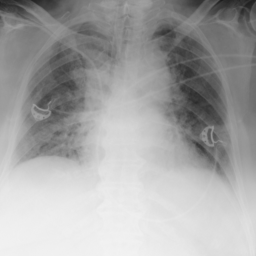

torch.Size([1, 256, 256]) ['COVID-19' 'Pneumonia' 'Viral Pneumonia']


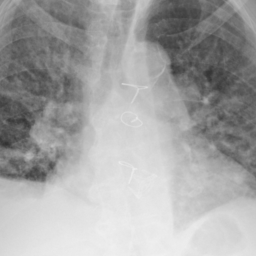

torch.Size([1, 256, 256]) ['COVID-19' 'Pneumonia' 'Viral Pneumonia']


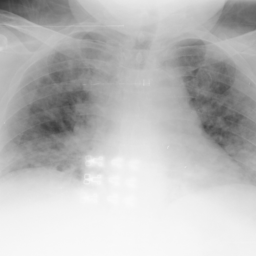

torch.Size([1, 256, 256]) ['COVID-19' 'Pneumonia' 'Viral Pneumonia']


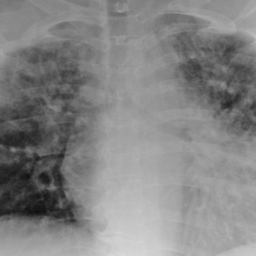

torch.Size([1, 256, 256]) ['COVID-19' 'Pneumonia' 'Viral Pneumonia']


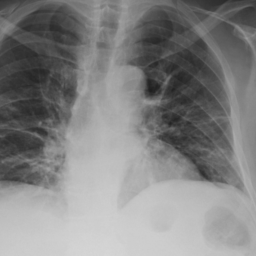

torch.Size([1, 256, 256]) ['COVID-19' 'Pneumonia' 'Viral Pneumonia']


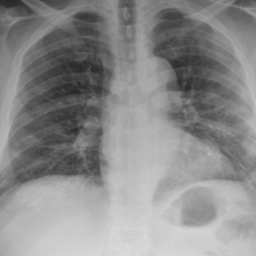

torch.Size([1, 256, 256]) ['COVID-19' 'Pneumonia' 'Viral Pneumonia']


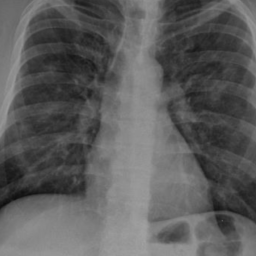

torch.Size([1, 256, 256]) ['COVID-19' 'Pneumonia' 'Viral Pneumonia']


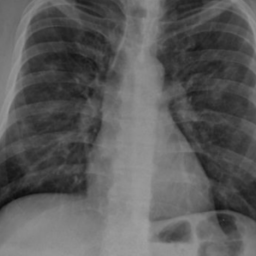

torch.Size([1, 256, 256]) ['COVID-19' 'Pneumonia' 'Viral Pneumonia']


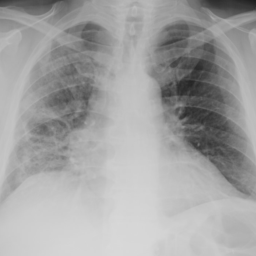

torch.Size([1, 256, 256]) ['COVID-19' 'Pneumonia' 'Viral Pneumonia']


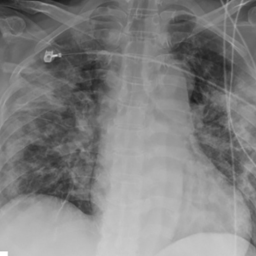

torch.Size([1, 256, 256]) ['COVID-19' 'Pneumonia' 'Viral Pneumonia']


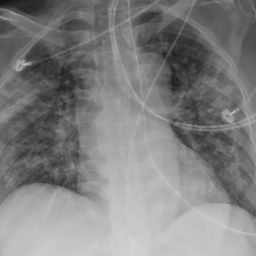

torch.Size([1, 256, 256]) ['COVID-19' 'Pneumonia' 'Viral Pneumonia']


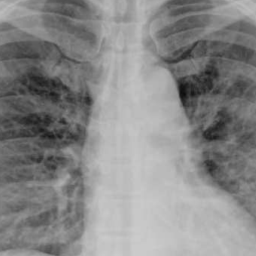

torch.Size([1, 256, 256]) ['COVID-19' 'Pneumonia' 'Viral Pneumonia']


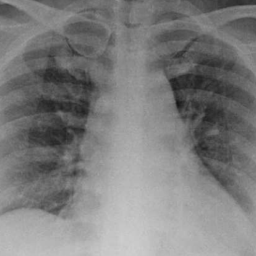

torch.Size([1, 256, 256]) ['COVID-19' 'Pneumonia' 'Viral Pneumonia']


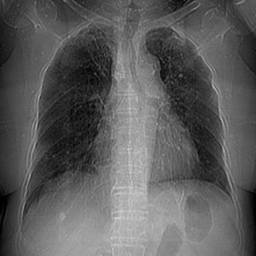

torch.Size([1, 256, 256]) ['COVID-19' 'Pneumonia' 'Viral Pneumonia']


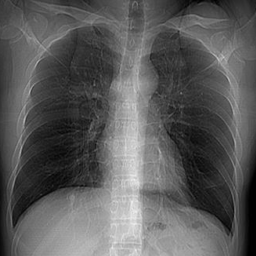

torch.Size([1, 256, 256]) ['COVID-19' 'Pneumonia' 'Viral Pneumonia']


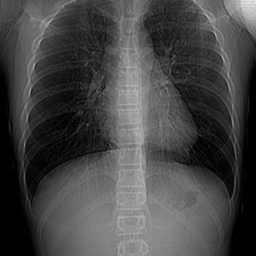

torch.Size([1, 256, 256]) ['COVID-19' 'Pneumonia' 'Viral Pneumonia']


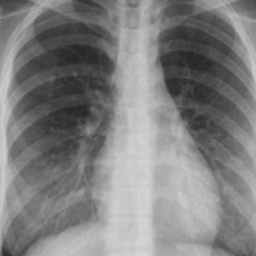

In [67]:
classes = np.array(sorted(["Pneumonia","Viral Pneumonia", "Bacterial Pneumonia", "No Finding", "COVID-19", "SARS", "MERS", "ARDS", "Streptococcus"]))
for i in range(len(covid_dataset)):
    data = covid_dataset.__getitem__(i)
    img = data['PA']
    labels = classes[data['lab']==1]
    print(img.shape, labels)
    display(transforms.ToPILImage()(img))

In [68]:
import model as mymodel
importlib.reload(mymodel)

<module 'model' from '/home/aka/Experiments/covid/covid-analysis/model.py'>

In [69]:
def initialize_using_pretrained(resnet):
    pretrained_resnet = torchvision.models.resnet18(pretrained=True)
    resnet.layer1.load_state_dict(pretrained_resnet.layer1.state_dict())
    resnet.layer2.load_state_dict(pretrained_resnet.layer2.state_dict())
    resnet.layer3.load_state_dict(pretrained_resnet.layer3.state_dict())
    resnet.layer4.load_state_dict(pretrained_resnet.layer4.state_dict())

In [70]:
resnet = mymodel.resnet18(num_classes=classes.shape[0])
initialize_using_pretrained(resnet)
resnet = resnet.to(device)

In [71]:
optimizer = torch.optim.Adam(resnet.parameters(), lr=args.lr)

In [72]:
def train_epoch(epoch, model, optimizer, dataloader, writer):
    model.train()
    start_time = time.time()
    loss_logger = AverageMeter()
    total_step = len(dataloader.dataset)//args.batch_size
    for idx, data in enumerate(dataloader):
        images = data['PA']
        labels = data['lab']
        images = images.to(device)
        labels = labels.to(device)
        pred = model(images)
        #pdb.set_trace()
        loss = F.binary_cross_entropy_with_logits(pred, labels)
        loss_logger.update(loss.item())
        
        if idx % args.log_step == 0:
            log_loss(epoch, idx, total_step, loss, start_time)
            start_time = time.time()
        
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
    writer.add_scalar('Loss', loss_logger.avg, epoch)
    
def get_accuracy(model, dataloader):    
    model.eval()
    total = 0
    correct = torch.zeros(classes.shape[0]).to(device)
    for data in dataloader:
        images = data['PA']
        labels = data['lab']
        images = images.to(device)
        labels = labels.to(device)
        pred = model(images)
        pred_labels = torch.sigmoid(pred) > 0.5
        total += labels.size(0)
        correct += torch.sum(pred_labels == labels, 0)
    return correct.cpu().numpy(), total

def test_epoch(epoch, model, dataloader, writer):
    model.eval()
    correct, total = get_accuracy(model, dataloader)
    total_accuracy = correct.sum() / (total * classes.shape[0])
    writer.add_scalar('Total Accuracy', total_accuracy, epoch)
    for idx, disease in enumerate(classes):
        accuracy = correct[idx]/total
        writer.add_scalar(disease, accuracy, epoch)
        
def train(model, optimizer, trainloader, testloader, writer):
    for epoch in range(args.num_epochs):
        train_epoch(epoch, model, optimizer, trainloader, writer)
        test_epoch(epoch, model, testloader, writer)
    print('Saving the model')
    torch.save(model.state_dict(), net_path)

In [73]:
train(resnet, optimizer, dataloader, dataloader, writer)

Epoch [0/30], Step [0/2], Loss: 0.7531, time: 2.1381s
Epoch [1/30], Step [0/2], Loss: 0.5895, time: 1.9211s
Epoch [2/30], Step [0/2], Loss: 0.5168, time: 1.5080s
Epoch [3/30], Step [0/2], Loss: 0.3788, time: 1.6879s
Epoch [4/30], Step [0/2], Loss: 0.3297, time: 1.6566s
Epoch [5/30], Step [0/2], Loss: 0.2749, time: 1.5216s
Epoch [6/30], Step [0/2], Loss: 0.2868, time: 1.8698s
Epoch [7/30], Step [0/2], Loss: 0.1647, time: 1.3666s
Epoch [8/30], Step [0/2], Loss: 0.1503, time: 1.8241s
Epoch [9/30], Step [0/2], Loss: 0.1518, time: 1.6644s
Epoch [10/30], Step [0/2], Loss: 0.1167, time: 1.5746s
Epoch [11/30], Step [0/2], Loss: 0.1151, time: 1.4564s
Epoch [12/30], Step [0/2], Loss: 0.1033, time: 1.4891s
Epoch [13/30], Step [0/2], Loss: 0.0796, time: 1.3679s
Epoch [14/30], Step [0/2], Loss: 0.0784, time: 1.5237s
Epoch [15/30], Step [0/2], Loss: 0.0904, time: 1.3906s
Epoch [16/30], Step [0/2], Loss: 0.0693, time: 1.7110s
Epoch [17/30], Step [0/2], Loss: 0.0643, time: 1.6607s
Epoch [18/30], Step 

## Insights from overfitted model
The above training overfits on the small training data we have. 
May be we can get some insights on what the model learned from this data.

In [74]:
import cam
importlib.reload(cam)

<module 'cam' from '/home/aka/Experiments/covid/covid-analysis/cam.py'>

['COVID-19' 'Pneumonia' 'Viral Pneumonia']


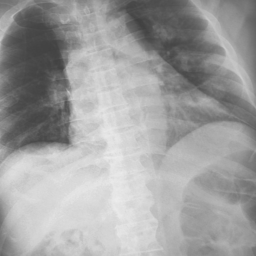

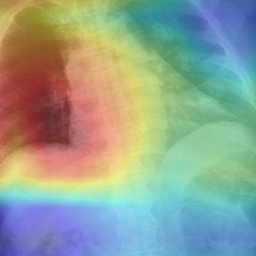

['COVID-19' 'Pneumonia' 'Viral Pneumonia']


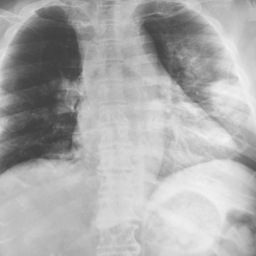

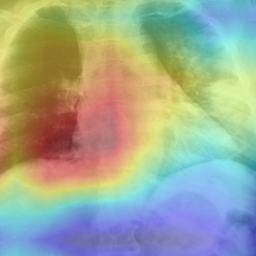

['COVID-19' 'Pneumonia' 'Viral Pneumonia']


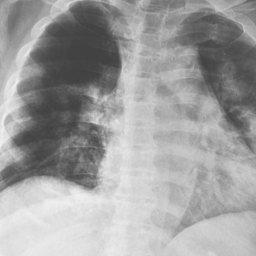

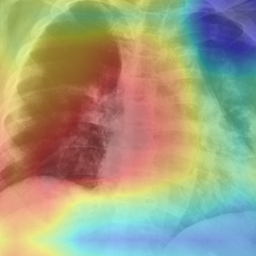

['COVID-19' 'Pneumonia' 'Viral Pneumonia']


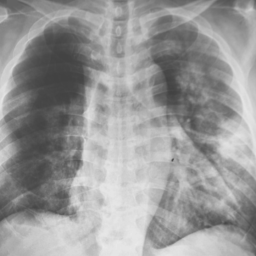

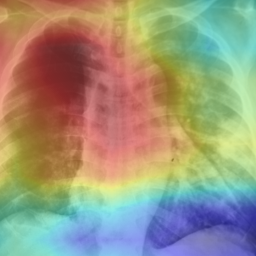

['COVID-19' 'Pneumonia' 'Viral Pneumonia']


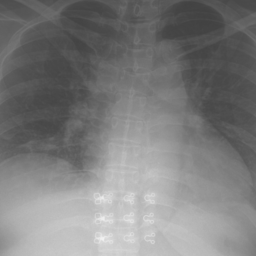

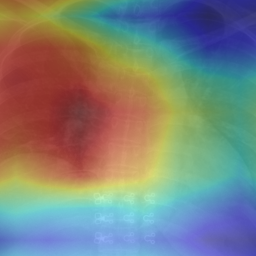

['COVID-19' 'Pneumonia' 'Viral Pneumonia']


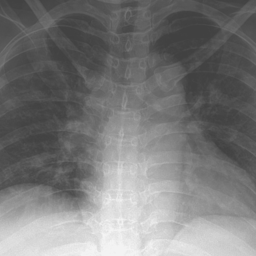

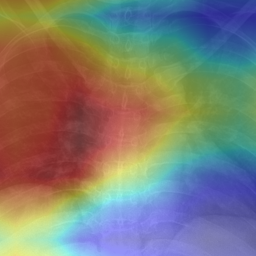

['COVID-19' 'Pneumonia' 'Viral Pneumonia']


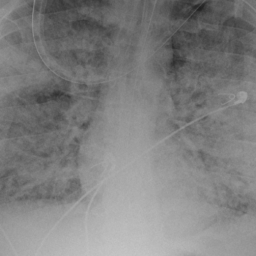

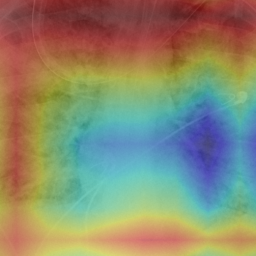

['ARDS' 'Pneumonia']


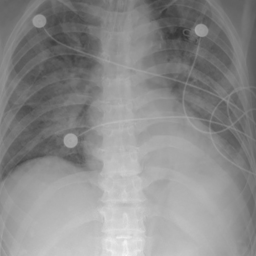

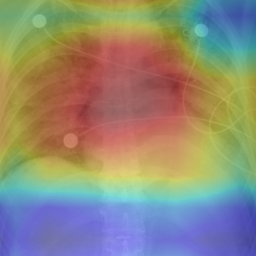

['COVID-19' 'Pneumonia' 'Viral Pneumonia']


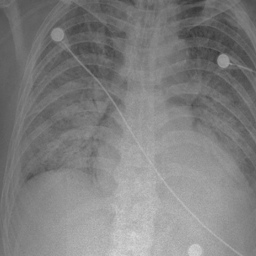

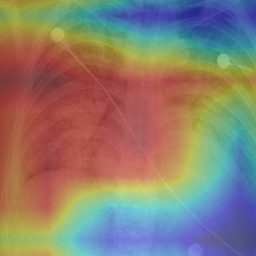

['COVID-19' 'Pneumonia' 'Viral Pneumonia']


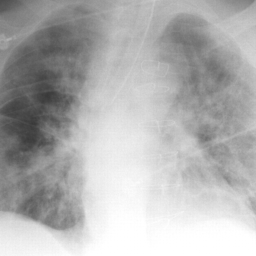

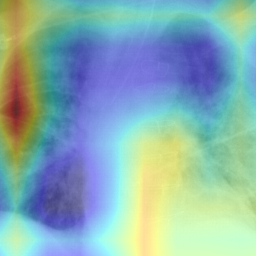

['Pneumonia' 'SARS' 'Viral Pneumonia']


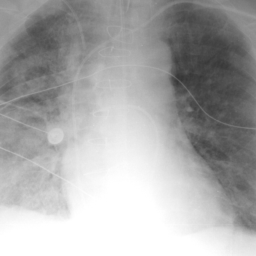

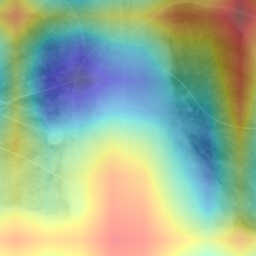

['Pneumonia' 'SARS' 'Viral Pneumonia']


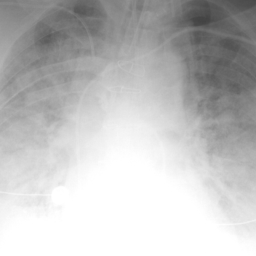

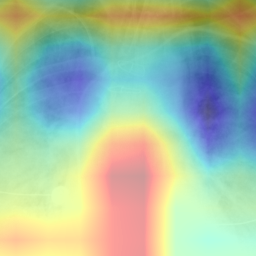

['Pneumonia' 'SARS' 'Viral Pneumonia']


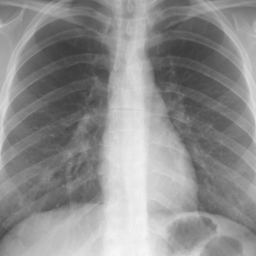

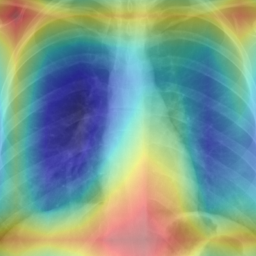

['Pneumonia' 'SARS' 'Viral Pneumonia']


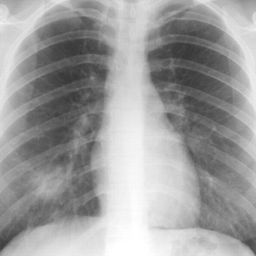

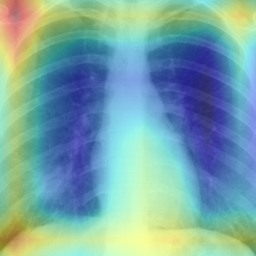

['Pneumonia' 'SARS' 'Viral Pneumonia']


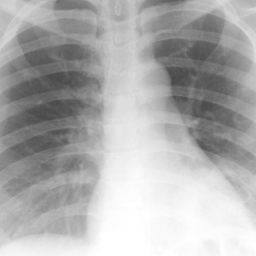

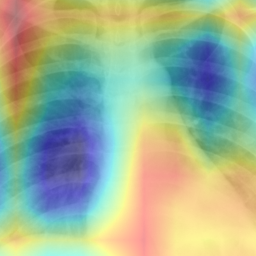

['Pneumonia' 'SARS' 'Viral Pneumonia']


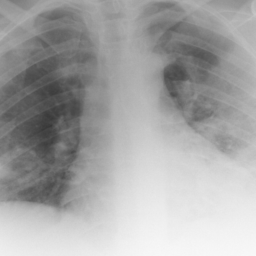

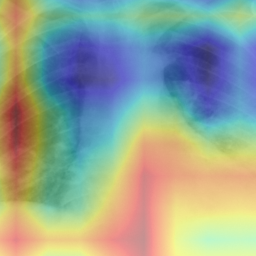

['Pneumonia' 'SARS' 'Viral Pneumonia']


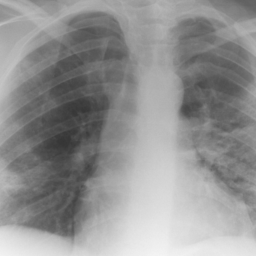

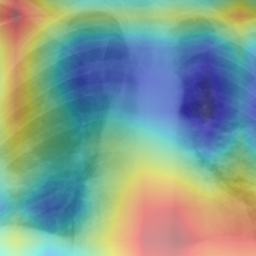

['Pneumonia' 'SARS' 'Viral Pneumonia']


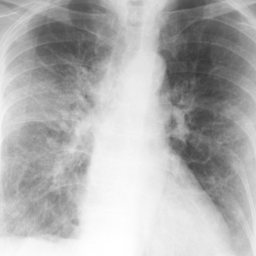

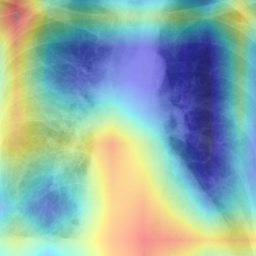

['Pneumonia' 'SARS' 'Viral Pneumonia']


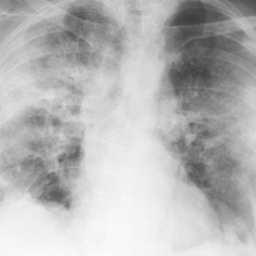

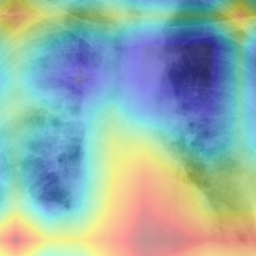

['Pneumonia' 'SARS' 'Viral Pneumonia']


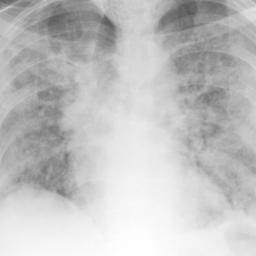

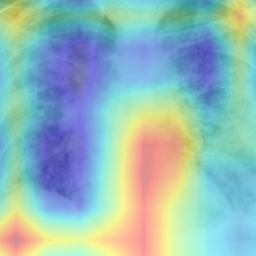

['Pneumonia' 'SARS' 'Viral Pneumonia']


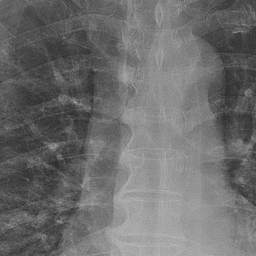

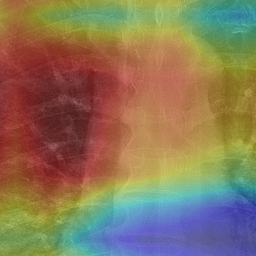

['COVID-19' 'Pneumonia' 'Viral Pneumonia']


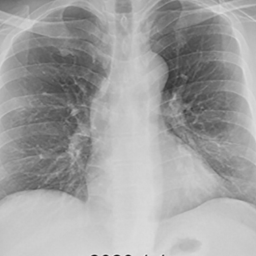

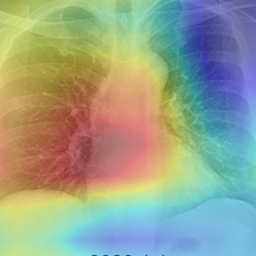

['COVID-19' 'Pneumonia' 'Viral Pneumonia']


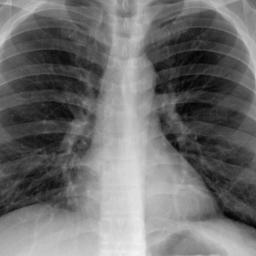

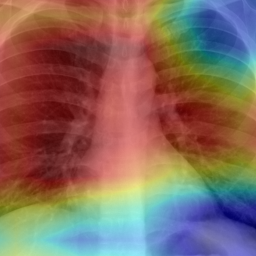

['COVID-19' 'Pneumonia' 'Viral Pneumonia']


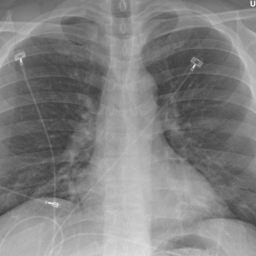

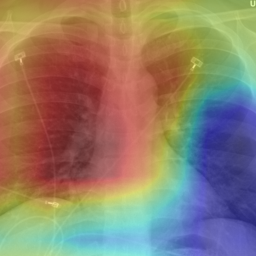

['COVID-19' 'Pneumonia' 'Viral Pneumonia']


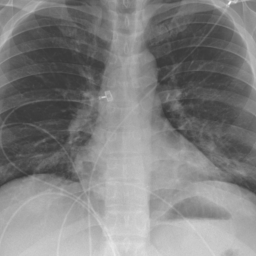

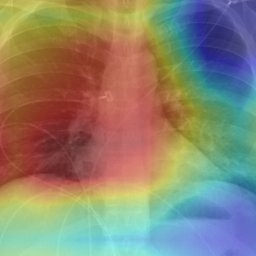

['COVID-19' 'Pneumonia' 'Viral Pneumonia']


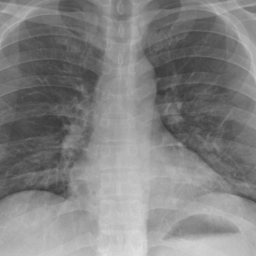

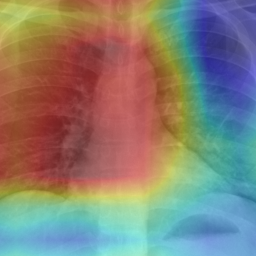

['COVID-19' 'Pneumonia' 'Viral Pneumonia']


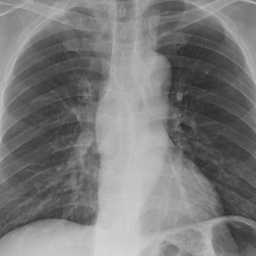

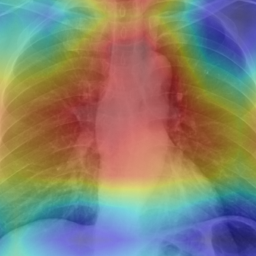

['COVID-19' 'Pneumonia' 'Viral Pneumonia']


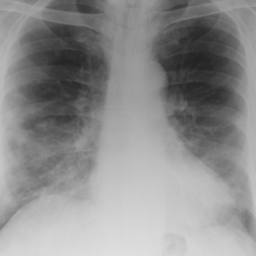

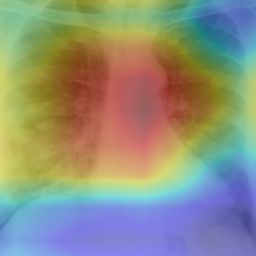

['COVID-19' 'Pneumonia' 'Viral Pneumonia']


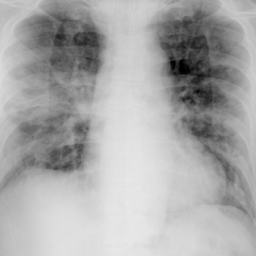

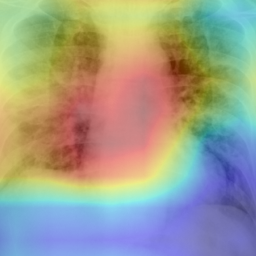

['COVID-19' 'Pneumonia' 'Viral Pneumonia']


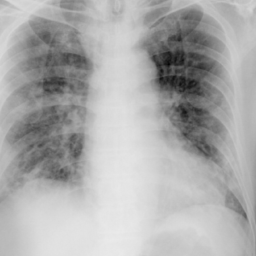

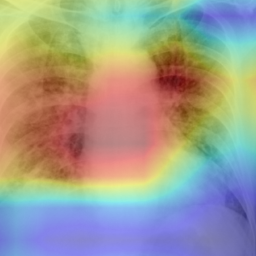

['COVID-19' 'Pneumonia' 'Viral Pneumonia']


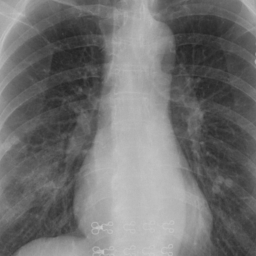

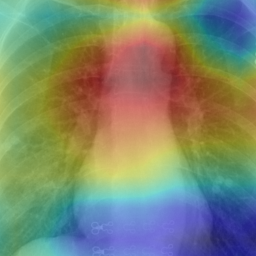

['COVID-19' 'Pneumonia' 'Viral Pneumonia']


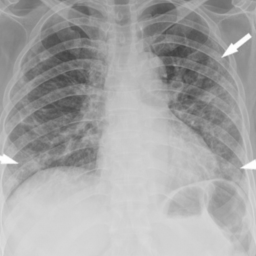

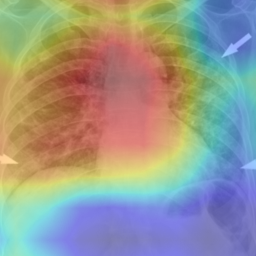

['COVID-19' 'Pneumonia' 'Viral Pneumonia']


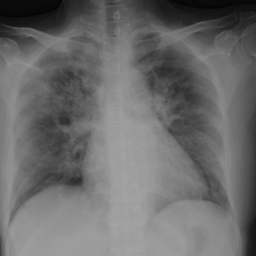

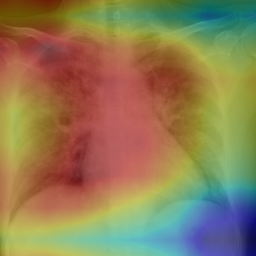

['COVID-19' 'Pneumonia' 'Viral Pneumonia']


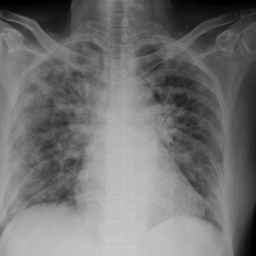

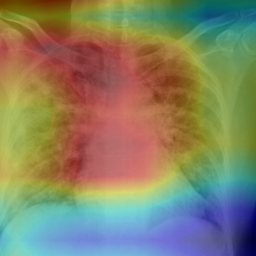

['COVID-19' 'Pneumonia' 'Viral Pneumonia']


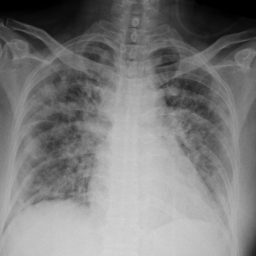

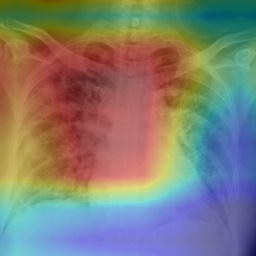

['COVID-19' 'Pneumonia' 'Viral Pneumonia']


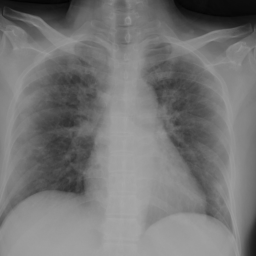

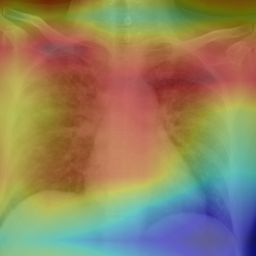

['COVID-19' 'Pneumonia' 'Viral Pneumonia']


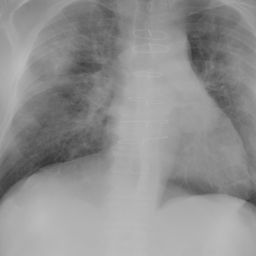

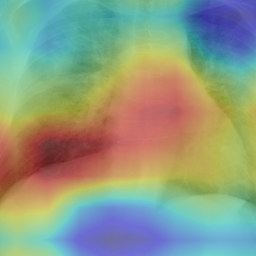

['COVID-19' 'Pneumonia' 'Viral Pneumonia']


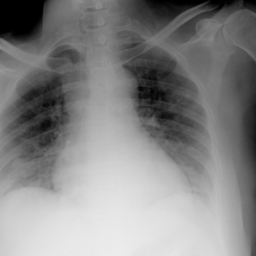

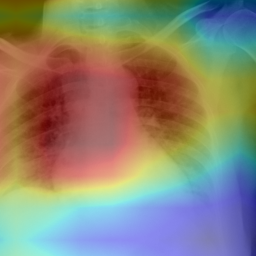

['COVID-19' 'Pneumonia' 'Viral Pneumonia']


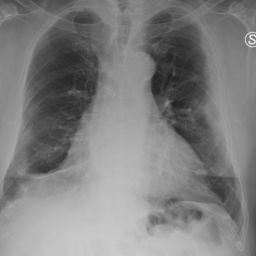

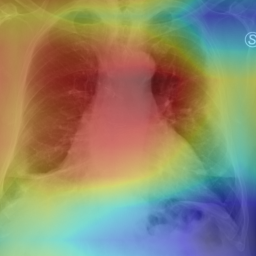

['COVID-19' 'Pneumonia' 'Viral Pneumonia']


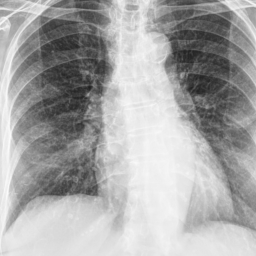

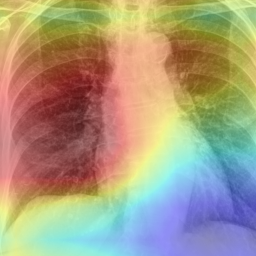

['COVID-19' 'Pneumonia' 'Viral Pneumonia']


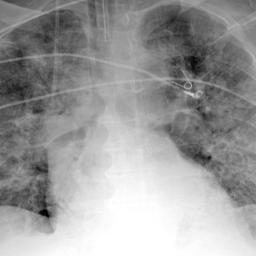

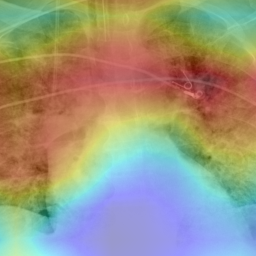

['COVID-19' 'Pneumonia' 'Viral Pneumonia']


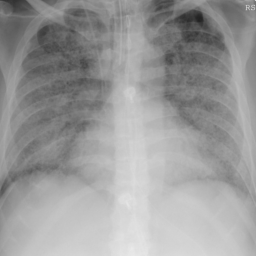

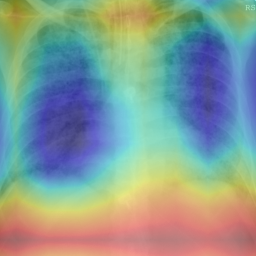

['ARDS' 'Pneumonia']


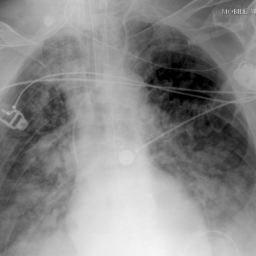

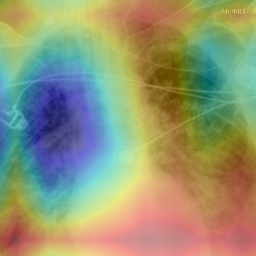

['ARDS' 'Pneumonia']


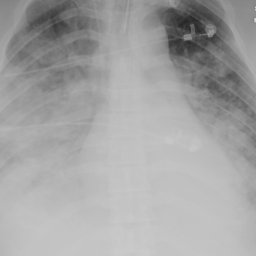

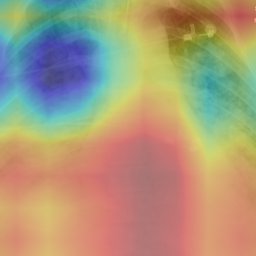

['ARDS' 'Pneumonia']


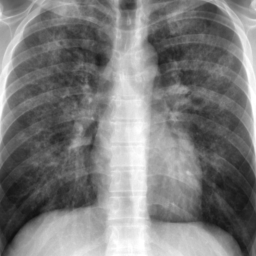

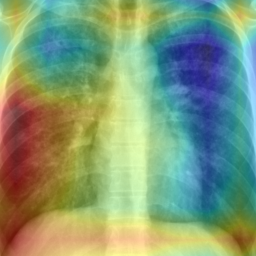

[]


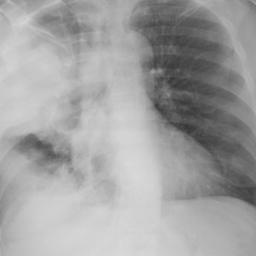

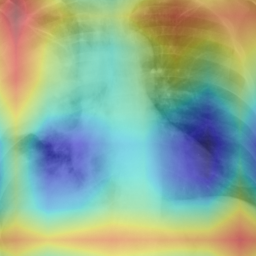

['Bacterial Pneumonia' 'Pneumonia' 'Streptococcus']


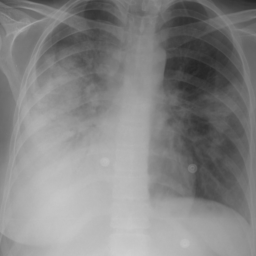

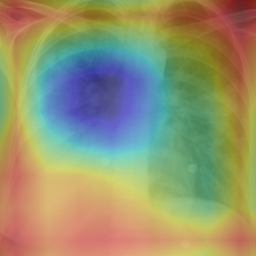

['Bacterial Pneumonia' 'Pneumonia' 'Streptococcus']


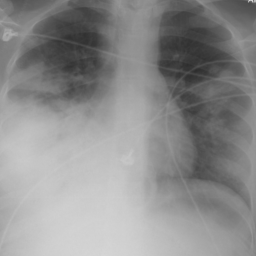

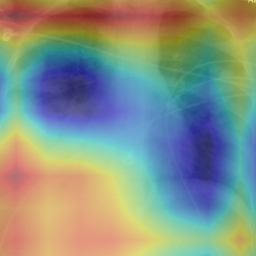

['Bacterial Pneumonia' 'Pneumonia' 'Streptococcus']


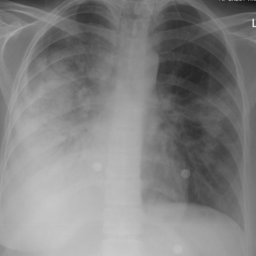

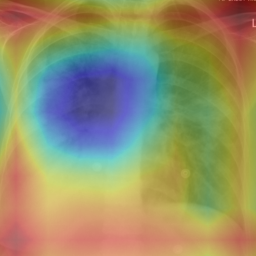

['Bacterial Pneumonia' 'Pneumonia' 'Streptococcus']


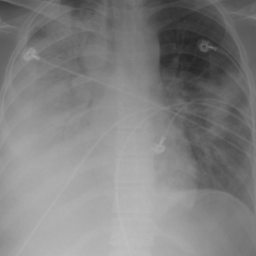

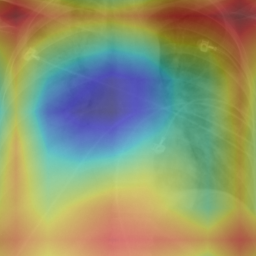

['Bacterial Pneumonia' 'Pneumonia' 'Streptococcus']


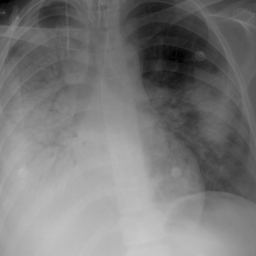

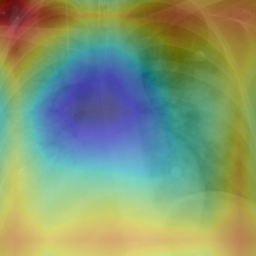

['Bacterial Pneumonia' 'Pneumonia' 'Streptococcus']


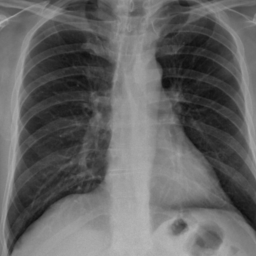

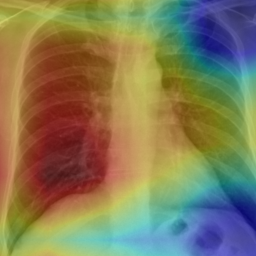

['COVID-19' 'Pneumonia' 'Viral Pneumonia']


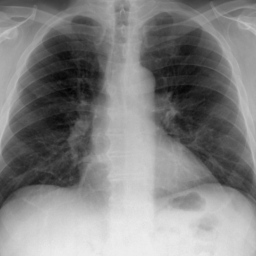

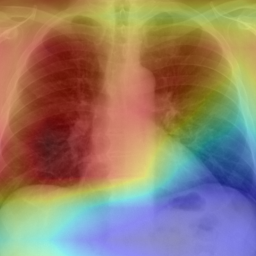

['COVID-19' 'Pneumonia' 'Viral Pneumonia']


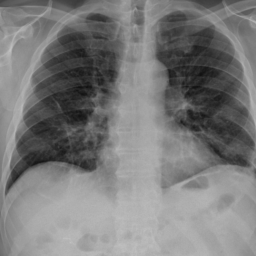

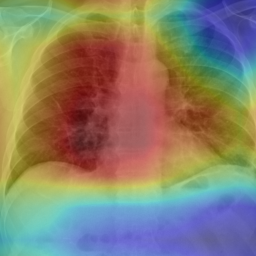

['COVID-19' 'Pneumonia' 'Viral Pneumonia']


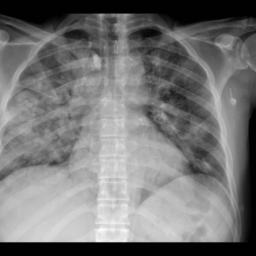

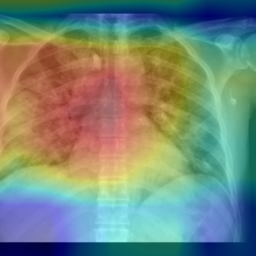

['COVID-19' 'Pneumonia' 'Viral Pneumonia']


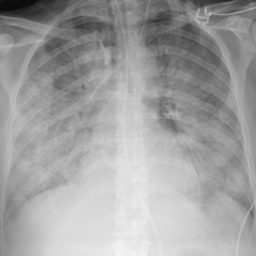

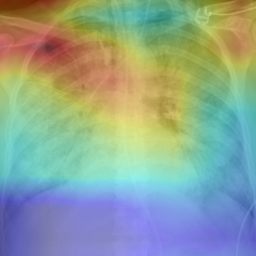

['COVID-19' 'Pneumonia' 'Viral Pneumonia']


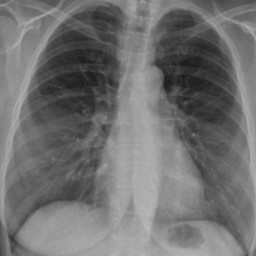

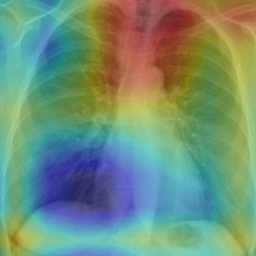

['No Finding']


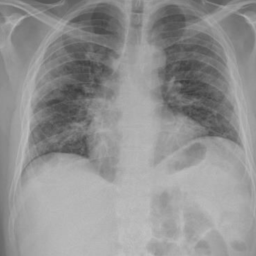

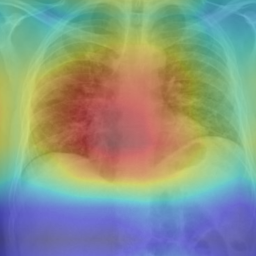

['COVID-19' 'Pneumonia' 'Viral Pneumonia']


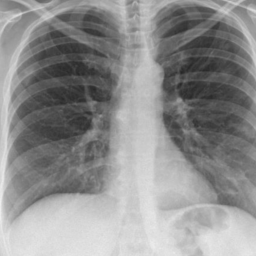

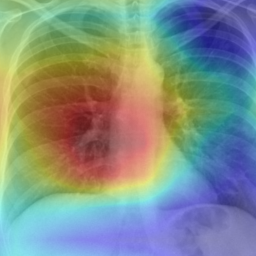

['COVID-19' 'Pneumonia' 'Viral Pneumonia']


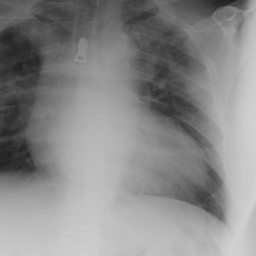

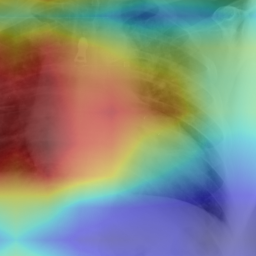

['COVID-19' 'Pneumonia' 'Viral Pneumonia']


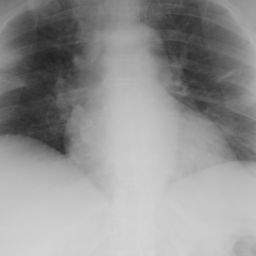

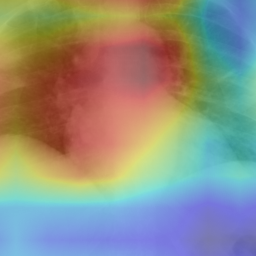

['COVID-19' 'Pneumonia' 'Viral Pneumonia']


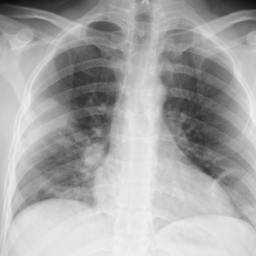

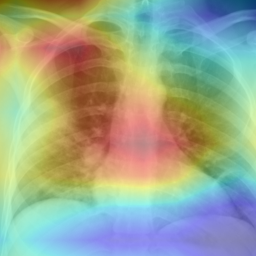

['COVID-19' 'Pneumonia' 'Viral Pneumonia']


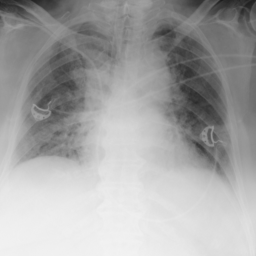

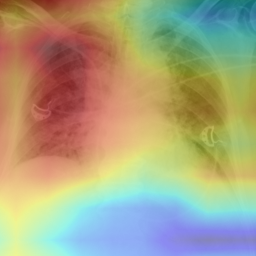

['COVID-19' 'Pneumonia' 'Viral Pneumonia']


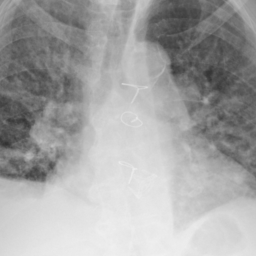

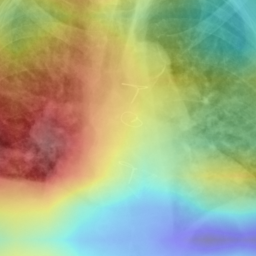

['COVID-19' 'Pneumonia' 'Viral Pneumonia']


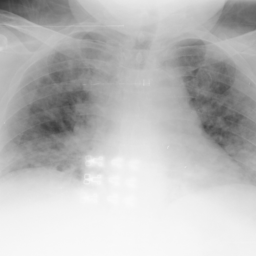

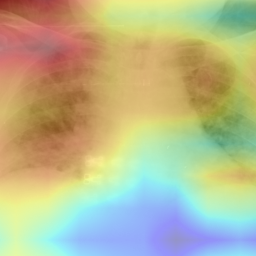

['COVID-19' 'Pneumonia' 'Viral Pneumonia']


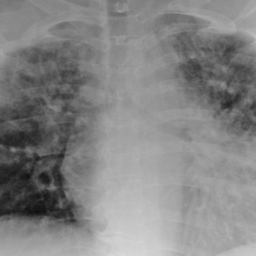

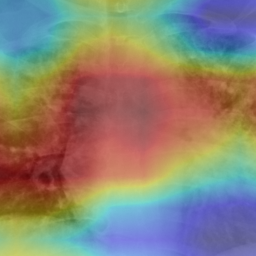

['COVID-19' 'Pneumonia' 'Viral Pneumonia']


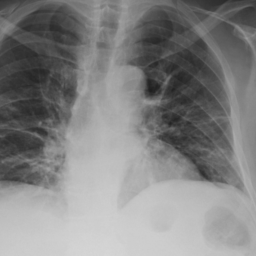

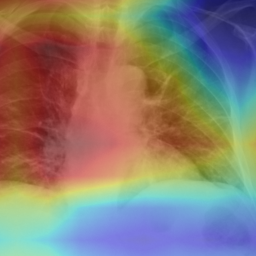

['COVID-19' 'Pneumonia' 'Viral Pneumonia']


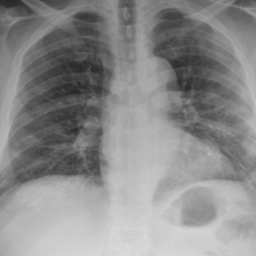

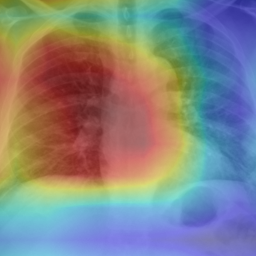

['COVID-19' 'Pneumonia' 'Viral Pneumonia']


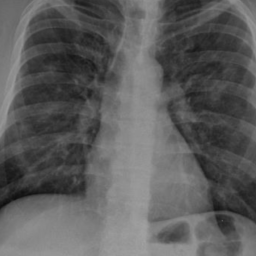

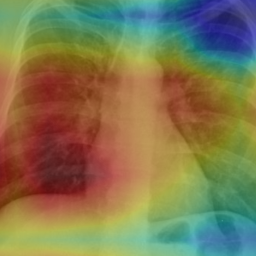

['COVID-19' 'Pneumonia' 'Viral Pneumonia']


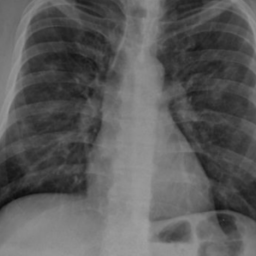

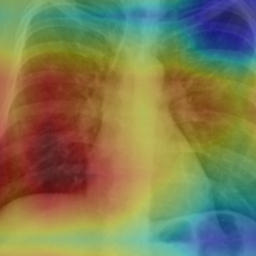

['COVID-19' 'Pneumonia' 'Viral Pneumonia']


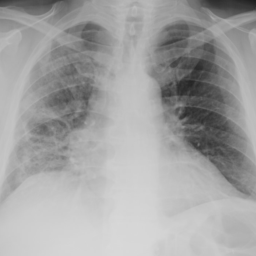

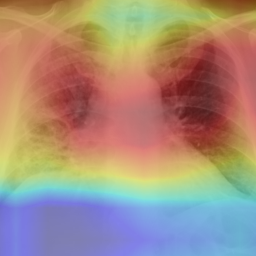

['COVID-19' 'Pneumonia' 'Viral Pneumonia']


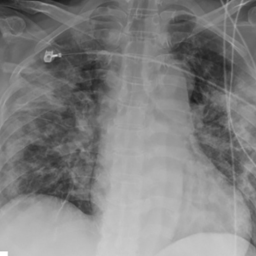

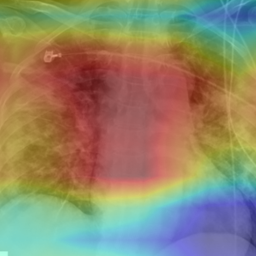

['COVID-19' 'Pneumonia' 'Viral Pneumonia']


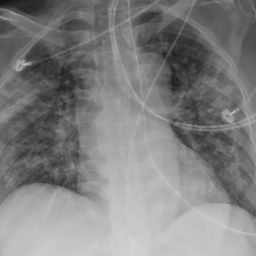

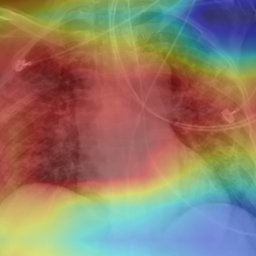

['COVID-19' 'Pneumonia' 'Viral Pneumonia']


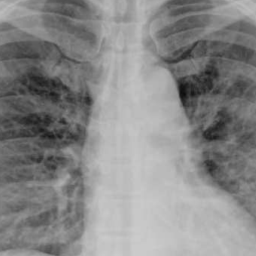

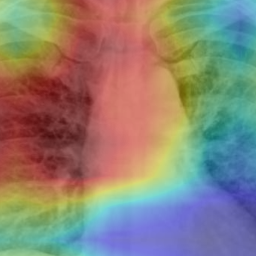

['COVID-19' 'Pneumonia' 'Viral Pneumonia']


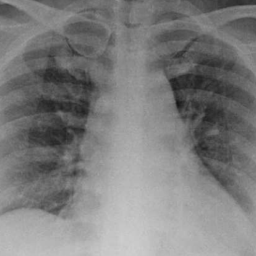

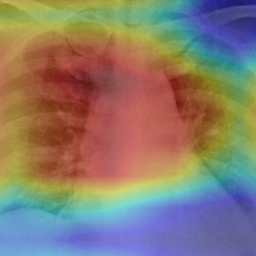

['COVID-19' 'Pneumonia' 'Viral Pneumonia']


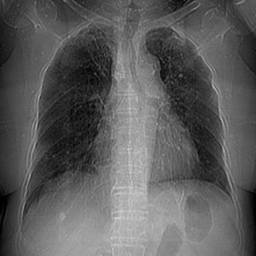

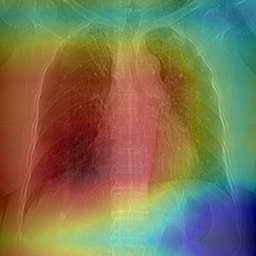

['COVID-19' 'Pneumonia' 'Viral Pneumonia']


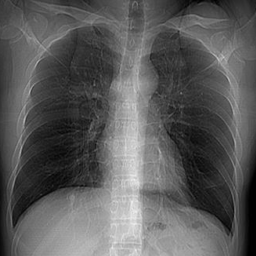

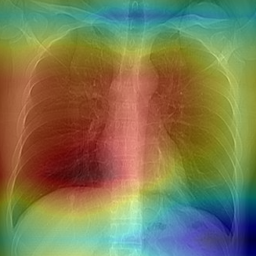

['COVID-19' 'Pneumonia' 'Viral Pneumonia']


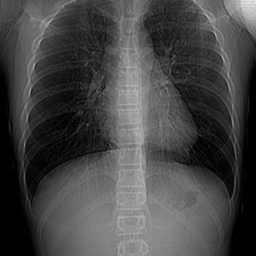

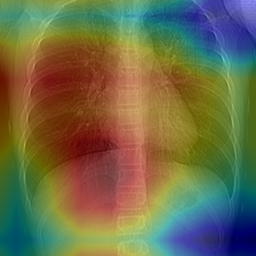

['COVID-19' 'Pneumonia' 'Viral Pneumonia']


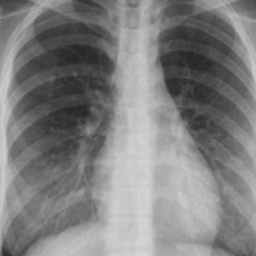

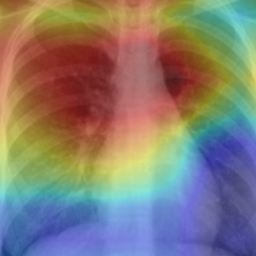

In [75]:
to_image = transforms.ToPILImage()
for i in range(len(covid_dataset)):
    labels = classes[data['lab']==1]
    #if 'COVID-19' not in labels:
    #    continue
    data = covid_dataset.__getitem__(i)
    img = data['PA']
    print(labels)
    cam_img = cam.get_cam_images(resnet, 'layer4', img.to(device).unsqueeze(0))[0]
    display(to_image(img), cam_img)

### Other visualization methods 
https://github.com/kazuto1011/grad-cam-pytorch#demo-1